# Notebook to make plots of the correlators for the paper

In [1]:
# Core Julia Libraries
using Random
using Statistics
using LinearAlgebra
using Dates

# I/O and Data
using DelimitedFiles
using JLD
using DataFrames
using DataStructures

# Plotting and Visualization
using Plots
using Colors
using LaTeXStrings

# Graph Algorithms
using Graphs

# Statistical Modeling
using GLM

# Project-specific Functions
include("common_functions.jl")

# Optional: plotting defaults (uncomment and customize if needed)
# default(framestyle = :box, aspect_ratio = :auto, fontfamily = "Times")

basis_path_to_all_path (generic function with 1 method)

# Default style for plots

In [2]:
# Plot size presets
size_sm = 1.2 .* (350, 250)
size_paper = 1.2 .* (350, 180)

# Font sizes
fntsize = 11
legendfntsize = 9

# Set default plotting styles
default(
    legendfontsize = legendfntsize,
    xformatter = :latex,
    yformatter = :latex,
    framestyle = :box,
    xtickfontsize = fntsize,
    ytickfontsize = fntsize,
    xguidefontsize = fntsize,
    yguidefontsize = fntsize,
    size = size_paper
)

# Color definitions (final choices)
col1 = :dodgerblue
col2 = :tomato
col3 = :blue2
col4 = :red

# Alternative color suggestions (uncomment to experiment)
# col2 = :firebrick
# col2 = :brown3
# col2 = :maroon3
# col2 = :red4

:red

# Define plotting functions

In [3]:
#--- Utility functions for plotting correlators with error bands and exponential fits ---#

function getlims(corr, log_dev)
    uplim = 10 .^ (log10.(corr) .+ log_dev) .- corr
    dnlim = corr .- 10 .^ (log10.(corr) .- log_dev)
    return (dnlim, uplim)
end

function plt_std(p, xarr, yarr, log_dev, lc=:black, lbl="")
    for i in 1:length(xarr)
        x, y, dev = xarr[i], yarr[i], log_dev[i]
        uplim = 10 ^ (log10(y) + dev)
        dnlim = 10 ^ (log10(y) - dev)
        plot!([x, x], [uplim, dnlim], label="", line=(3.0, lc, :solid, :path))
    end
    plot!([1000, 1000], [1000, 2000], label=lbl)
    return p
end

function clip_negative(vec)
    return [v > 0 ? v : 1e-10 for v in vec]
end

function getrib(corr, sd)
    uplim = corr .+ sd
    dnlim = clip_negative(corr .- sd)
    return (corr .- dnlim, sd)
end

function plt_corr(data2, data3, trimlim, line=true; verbose=true, mkrsz=4)
    dist2, corr2, sdev2, err2 = data2
    dist3, corr3, sdev3, err3 = data3

    # Region R2 plot styles
    mshape2, lbl2 = :rect, L"$R_1$"
    cola2, colb2 = :tomato, :red

    # Region R3 plot styles
    mshape3, lbl3 = :circle, L"$R_2$"
    cola3, colb3 = :dodgerblue, :blue

    # Shaded ribbons
    plot!(dist2, corr2, ribbon=getrib(corr2, sdev2), linewidth=0.0, label=false, fillcolor=cola2, fillstyle=:\)
    plot!(dist3, corr3, ribbon=getrib(corr3, sdev3), linewidth=0.0, label=false, fillcolor=cola3, fillstyle=:/)

    # Region R2 points and spread
    scatter!(dist2, corr2, yerr=err2, label=lbl2, markercolor=colb2, markershape=mshape2,
             markerstrokecolor=colb2, markersize=mkrsz)
    plot!(Shape([(-1,-1), (-2,-1), (-2,-2), (-1,-2)]), fillcolor=plot_color(cola2, 1.0),
          fillstyle=:\, label=L"$R_1~\textrm{Spread}$")

    # Fit for R2
    ξ2 = 0.0
    if line
        ssd, ssc = distance_trim(dist2, log.(corr2), trimlim...)
        data = DataFrame(x=convert(Vector{Float64}, ssd), y=convert(Vector{Float64}, ssc))
        lm2 = lm(@formula(y ~ x), data)
        c, m = coef(lm2)
        m_err = stderror(lm2)[2]
        ξ2, eξ = 1/m, m_err/m^2
        verbose && println("R2: m = $m ± $m_err,  ξ = $ξ2 ± $eξ")
        plot!(dist2, exp.(m .* dist2 .+ c), linecolor=cola2, label=false)
    end

    # Clip negative bars for R2
    for i in findall(i -> corr2[i] - err2[i] < 0, eachindex(err2))
        plot!([dist2[i], dist2[i]], [1e-10, corr2[i] + err2[i]], label=false, lc=colb2)
    end

    # Region R3 points and spread
    scatter!(dist3, corr3, yerr=err3, label=lbl3, markercolor=colb3, markershape=mshape3,
             markerstrokecolor=colb3, markersize=mkrsz)
    plot!(Shape([(-1,-1), (-2,-1), (-2,-2), (-1,-2)]), fillcolor=plot_color(cola3, 1.0),
          fillstyle=:/, label=L"$R_2~\textrm{Spread}$")

    # Fit for R3
    ξ3 = 0.0
    if line
        ssd, ssc = distance_trim(dist3, log.(corr3), trimlim...)
        data = DataFrame(x=convert(Vector{Float64}, ssd), y=convert(Vector{Float64}, ssc))
        lm2 = lm(@formula(y ~ x), data)
        c, m = coef(lm2)
        m_err = stderror(lm2)[2]
        ξ3, eξ = 1/m, m_err/m^2
        verbose && println("R3: m = $m ± $m_err,  ξ = $ξ3 ± $eξ")
        plot!(dist3, exp.(m .* dist3 .+ c), linecolor=colb3, label=false)
    end

    # Clip negative bars for R3
    for i in findall(i -> corr3[i] - err3[i] < 0, eachindex(err3))
        plot!([dist3[i], dist3[i]], [1e-10, corr3[i] + err3[i]], label=false, lc=colb3)
    end

    return ξ2, ξ3
end

plt_corr (generic function with 2 methods)

# Dimer-dimer correlator (Fig. 2 of the paper)

In [27]:
# ╔══════════════════════════════════════════════╗
# ║     📂 Load and Prepare sz-sz Correlator Data ║
# ╚══════════════════════════════════════════════╝
# Takes about 3 minutes to run
# ░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░
# Load ⟨SᶻSᶻ⟩ correlator data for region R2
# The JLD file contains pre-averaged correlator data with standard deviation bins
# The tuple structure extracted: 
# (distances, mean correlation, envelope lower bound, envelope upper bound,
# standard error, radius of averaging, log deviation, data bins)
# ░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░
region = "R2"
clean_dist, clean_szsz_conn, env_dn, env_up, clean_err, averaging_radius, log_dev, bins =
    load("./data/plot_data/paper-"*region*"-szsz.jld")["szsz_plot_data"]

# Combine relevant quantities into a tuple for later plotting:
# (distance, mean value, standard deviation, standard error)
data2 = clean_dist, clean_szsz_conn, std.(bins), clean_err


# ░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░
# Repeat the same for region R3
# ░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░
region = "R3"
clean_dist, clean_szsz_conn, env_dn, env_up, clean_err, averaging_radius, log_dev, bins =
    load("./data/plot_data/paper-"*region*"-szsz.jld")["szsz_plot_data"]

data3 = clean_dist, clean_szsz_conn, std.(bins), clean_err

(Any[0.2, 0.6000000000000001, 1.0, 1.4000000000000001, 1.8, 2.2, 2.6, 3.0, 3.4000000000000004, 3.8000000000000003  …  16.2, 16.6, 17.0, 17.400000000000002, 17.8, 18.2, 18.6, 19.0, 19.400000000000002, 19.8], Any[0.2313137629936967, 0.26393790014178564, 0.05284040784257546, 0.042101512780277725, 0.0011724203503775728, 0.009472048921905124, 0.00027508878790843456, 0.002279177539655068, 0.0003417339253877317, 0.0006608074126668449  …  7.80386886701617e-7, 3.448935381767009e-7, 9.107913067453941e-7, 1.0449071180427124e-6, 1.8178338555278852e-6, 2.1972307848075944e-7, 9.076282348972687e-7, 1.3520373841170142e-6, 2.861926544028109e-6, 1.8901675607353103e-6], [0.16035826005239417, 0.261895645298122, 0.19358786828485866, 0.09223813755798617, 0.0515792175226316, 0.030011023018931954, 0.018508200161393037, 0.012210470401819698, 0.007052969364149464, 0.007176725576284285  …  0.00020867957239979678, 0.00021077367665349716, 0.00020431941333496254, 0.000204828324138936, 0.00020393054592867112, 0.0002

R2: m = -1.4628700501640193 ± 0.18808366384768166,  ξ = -0.683587718463358 ± 0.08789002320161673
R3: m = -1.5125931957978893 ± 0.20017947495819127,  ξ = -0.6611162887537004 ± 0.08749339342308339


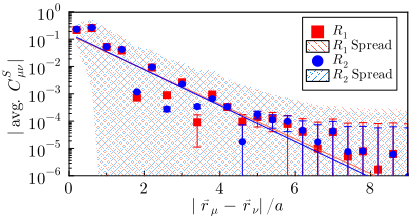

"/Users/jeet/umd/acad/projects/quasicrystals/penrose-dimer-monte-carlo/images/paper/dimer.pdf"

In [28]:
# ╔════════════════════════════════════════════════════════════════╗
# ║   📊 Plot: sz-sz Correlator ⟨SᶻSᶻ⟩ vs Distance for R2 and R3   ║
# ╚════════════════════════════════════════════════════════════════╝

# ░░░ Initialize plot with log-scale on y-axis and appropriate limits ░░░
p = plot(xlim = (0, 9), ylim = (1e-6, 1), yaxis = :log)

# ░░░ Plot sz-sz correlators for both R2 and R3 with error bars and fitted lines ░░░
trimlim = [0, 6]  # range for exponential fit
plt_corr(data2, data3, trimlim)

# ░░░ Axis and formatting settings ░░░
plot!(bottom_margin = 1Plots.mm)  # Adjust bottom margin for labels
plot!(xlabel = L"$| \vec{r}_{\mu} - \vec{r}_{\nu} | / a$", 
      ylabel = L"$|\textrm{avg.}~ C_{\mu\nu}^S |$")

plot!(xticks = [0, 2, 4, 6, 8, 10], xminorticks = 2)  # minor x-ticks for clarity
plot!(grid = false, widen = false, framestyle = :semi, legend = :topright)

# ░░░ Bounding box lines at plot limits (for visual emphasis) ░░░
vline!(p, [xlims(p)[2]], lc = :black, lw = 2, label = "")
hline!(p, [ylims(p)[2]], lc = :black, lw = 2, label = "")

# ░░░ Minor ticks on y-axis for log scale clarity ░░░
plot!(p, yminorticks = 10)

# ░░░ Display the plot ░░░
display(p)

# Optional: Save the figure (uncomment to use)
savefig("./images/paper/dimer.pdf")

### Log-log scale plot for the referee report

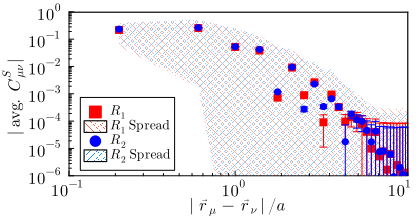

"/Users/jeet/umd/acad/projects/quasicrystals/penrose-dimer-monte-carlo/images/paper/dimer-log-log.pdf"

In [29]:
# Plot average spin-spin correlator in log-log scale for regions R2 and R3

p = plot(xlim = (0.1, 11), ylim = (1e-6, 1), xaxis = :log, yaxis = :log)

# Plot the two datasets without exponential fit lines
trimlim = [0, 6]
plt_corr(data2, data3, trimlim, false)

# Axis labels and ticks
plot!(xlabel = "\$ | \\vec{r}_{\\mu} - \\vec{r}_{\\nu} \\; |/a \$")
plot!(ylabel = L"$|\textrm{avg.~} C_{\mu\nu}^S |$")
plot!(xticks = [0.1, 1.0, 10], xminorticks = 10)

# Aesthetic settings
plot!(grid = false, framestyle = :semi, legend = :bottomleft, bottom_margin = 1Plots.mm)
vline!([xlims(p)[2]], lc = :black, lw = 2, label = "")
hline!([ylims(p)[2]], lc = :black, lw = 2, label = "")
plot!(yminorticks = 10)

# Display the plot
display(p)
savefig("./images/paper/dimer-log-log.pdf")

# Vison correlator (Fig. 3 of the paper)

In [30]:
# Load path-averaged vison correlator data for regions R2 and R3
# Each file contains: distances, correlators, envelope bounds, errors, and spread statistics

# --- Region R2 ---
dist_mean, corr_mean, env_dn, env_up, err_mean, rgn, fraction, log_dev, bins = 
    load("./data/plot_data/paper-R2-vison.jld")["vison_plot_data"]
data2 = dist_mean, corr_mean, std.(bins), err_mean

# --- Region R3 ---
dist_mean, corr_mean, env_dn, env_up, err_mean, rgn, fraction, log_dev, bins = 
    load("./data/plot_data/paper-R3-vison.jld")["vison_plot_data"]
data3 = dist_mean, corr_mean, std.(bins), err_mean
;

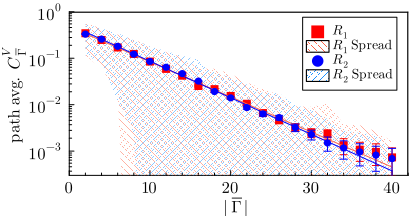

R2: m = -0.1741330091393677 ± 0.0023588203685429407,  ξ = -5.742736572131755 ± 0.07779159198173172
R3: m = -0.18124643429019993 ± 0.0018194394611667382,  ξ = -5.517349921482403 ± 0.05538582983727736


In [31]:
# --- Plot: Vison Path-Averaged Correlators (Linear x-axis, Log y-axis) ---

# Set axis limits and log scale for y-axis
p = plot(xlim=(0, 42), ylim=(3e-4, 1.0), yaxis=:log)

# Specify trimming range for exponential fit
trimlim = [0, 35]

# Plot data for both regions using helper
plt_corr(data2, data3, trimlim)

# Configure ticks and labels
plot!(xminorticks=5)
plot!(yticks=[1e-4, 1e-3, 1e-2, 1e-1, 1e0], yminorticks=10)
plot!(xlabel=L"$|\overline{\Gamma}\;|$", ylabel=L"\textrm{path~avg.~}C_{\overline{\Gamma}}^V")

# Plot aesthetics
plot!(grid=false, widen=false, framestyle=:semi, legend=:topright)

# Draw bounding lines (visual framing)
vline!(p, [xlims(p)[2]], lc=:black, lw=2, label="")
hline!(p, [ylims(p)[2]], lc=:black, lw=2, label="")

# Save or display the plot
savefig("./images/paper/vison.pdf")
display(p)

## Vison Euclidean (Fig. S5 of the Supplementary Material)

In [32]:
# --- Load Euclidean Vison Correlator Data for R2 ---
avg_d, avg_cs, avg_err, region, averaging_radius, bins = 
    load("./data/plot_data/paper-R2-vison-euclidean.jld")["euclidean_vison_plot_data"]

# Package into tuple: (distances, mean correlator, std dev of bin values, error estimate)
data2 = avg_d, avg_cs, std.(bins), avg_err

# --- Load Euclidean Vison Correlator Data for R3 ---
avg_d, avg_cs, avg_err, region, averaging_radius, bins = 
    load("./data/plot_data/paper-R3-vison-euclidean.jld")["euclidean_vison_plot_data"]

# Package into tuple for region R3
data3 = avg_d, avg_cs, std.(bins), avg_err
;

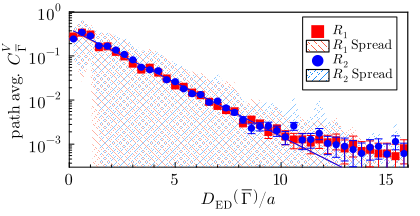

R2: m = -0.5588667632184666 ± 0.010700827366589574,  ξ = -1.7893352509300862 ± 0.03426105984705193
R3: m = -0.5620400828355074 ± 0.01161844133410843,  ξ = -1.7792325325890868 ± 0.03678013264700469


In [33]:
# --- Plot Euclidean-Distance Vison Correlators for R2 and R3 ---

# Initialize log-y plot with defined limits
p = plot(xlim = (0, 16), ylim = (3e-4, 1.0), yaxis = :log)

# Set range to trim for linear fitting in log scale
trimlim = [0, 10]

# Overlay correlator plots for both regions (with fits and spreads)
plt_corr(data2, data3, trimlim)

# Minor layout adjustments
plot!(bottom_margin = 3Plots.mm)
plot!(xminorticks = 5, yminorticks = 10)
plot!(yticks = [1e-4, 1e-3, 1e-2, 1e-1, 1e0])

# Remove grid, keep simple frame, place legend
plot!(grid = false, widen = false, framestyle = :semi, legend = :topright)

# Add visual cues at plot edges
vline!([xlims(p)[2]], lc = :black, lw = 2, label = "")
hline!([ylims(p)[2]], lc = :black, lw = 2, label = "")

# Axis labels
plot!(xlabel = L"$D_{\textrm{ED}}\left( \overline{\Gamma} \right)/a$", 
      ylabel = L"\textrm{path~avg.~}C_{\overline{\Gamma}}^V")

# Save and display the figure
savefig("./images/paper/vison-euclidean.pdf")
display(p)

# Wilson loops and lines (Fig. 4 of the paper)
Path averages of the products of open Wilson lines and path averages of closed Wilson loops corresponding to monomers and visons.


In [34]:
"""
    plot_fm_setting(p)

Apply consistent visual styling to a figure `p` for finite-momentum correlator plots.
This includes removing the grid, setting frame style, resizing, and adding corner anchor lines.
"""
function plot_fm_setting(p)
    # Simplify frame and disable grid/legend
    plot!(p, grid = false, legend = false, widen = false, framestyle = :semi)

    # Add anchor corner lines at top/right edges
    vline!(p, [xlims(p)[2]], lc = :black, lw = 2)
    hline!(p, [ylims(p)[2]], lc = :black, lw = 2)

    # Set plot size for paper format
    size_paper_fm = 1.2 .* (175, 160)
    plot!(p, size = size_paper_fm)

    # Add minor ticks on y-axis
    plot!(p, yminorticks = 10)
end

plot_fm_setting

In [35]:
mkrsz = 3

3

## Path averaged product of Monomer Wilson lines (Fig. 4a)

In [36]:
# === Load and Package Monomer Loop Correlator Data for Region R2 ===
fl = load( "./data/plot_data/paper-R2-monomer-lines.jld")
mean_num_prod     = fl["mean_num_prod"]
mean_dist_num     = fl["mean_dist_num_prod"]
env_up            = fl["env_up"]
env_dn            = fl["env_dn"]
mean_dev_num_prod = fl["mean_dev_num_prod"]
bins              = fl["bins"]

# Select indices to include (here: all)
inds = 1:length(mean_dev_num_prod)

# Package into data2 for plotting
data2 = mean_dist_num[inds], mean_num_prod[inds], std.(bins)[inds], mean_dev_num_prod[inds]

# === Load and Package Monomer Loop Correlator Data for Region R3 ===
fl = load( "./data/plot_data/paper-R3-monomer-lines.jld")
mean_num_prod     = fl["mean_num_prod"]
mean_dist_num     = fl["mean_dist_num_prod"]
env_up            = fl["env_up"]
env_dn            = fl["env_dn"]
mean_dev_num_prod = fl["mean_dev_num_prod"]
bins              = fl["bins"]

# Select indices to include (here: all)
inds = 1:length(mean_dev_num_prod)

# Package into data3 for plotting
data3 = mean_dist_num[inds], mean_num_prod[inds], std.(bins)[inds], mean_dev_num_prod[inds]


(Any[4, 6, 8, 10, 12, 14, 16, 18, 20], Any[0.003771693008707592, 0.003995763854253825, 0.00021262258014610814, 0.00019420172455264137, 1.0553586378596162e-5, 1.2334791553096295e-5, 7.34823976946749e-7, 8.266968134174311e-7, 5.504800076853526e-8], [0.0059851997244105126, 0.0029872620426538827, 0.0003646243200343555, 0.0002553371253583399, 3.087915296543089e-5, 2.5248807892386507e-5, 3.393560919511632e-6, 2.9706665469147077e-6, 3.3115030473544847e-7], Any[0.00020536167977619097, 3.415785307336264e-5, 1.704811249641589e-5, 8.641404261247066e-6, 1.2808798328366843e-6, 2.601304749444489e-7, 1.3438475509856182e-8, 9.764528806112132e-9, 9.227240636143612e-10])

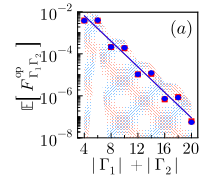

R2: m = -0.6969048585016603 ± 0.05120184791591075,  ξ = -1.434916097657852 ± 0.10542379624433978
R3: m = -0.7006749781169714 ± 0.05230543507151209,  ξ = -1.4271952491973516 ± 0.10654022303162713


In [37]:
# --- Plot Monomer Lines product: R2 and R3 Correlators ---
# Create a log-scale plot with specified x/y limits
pa = plot(xlim = (3, 21), ylim = (1e-8, 1e-2), yaxis = :log)

# Set fitting/truncation range for exponential tail
trimlim = [0, 21]

# Plot correlators for R2 and R3 with size and fit disabled
plt_corr(data2, data3, trimlim; mkrsz = mkrsz)

# Set ticks and axes labels
plot!(yticks = [1e-8, 1e-6, 1e-4, 1e-2], xminorticks = 2, xticks = [4, 8, 12, 16, 20])
plot!(xlabel = L"$ |\Gamma_1\;| + |\Gamma_2\;|$")
plot!(ylabel = L"\mathbb{E} \left[ F_{\Gamma_{1}\Gamma_{2}}^{\textrm{op}} \right]")

# Add panel label (a)
annotate!(18.7, 1.5e-3, text(L"(a)", 12))

# Apply formatting: frame style, size, anchor lines, etc.
plot_fm_setting(pa)

# Display the figure
savefig("./images/paper/monomer-lines.pdf")
display(pa)

## Path averaged Monomer Wilson loops (Fig. 4b)

In [38]:
# === Load and Package Monomer Loop Denominator Data for Region R2 ===
fl = load("./data/plot_data/paper-R2-monomer-loops.jld")
mean_den      = fl["mean_den"]
mean_dist_den = fl["mean_dist_den"]
env_up        = fl["env_up"]
env_dn        = fl["env_dn"]
mean_dev_den  = fl["mean_dev_den"]
bins          = fl["bins"]

# Package into data2 for plotting
data2 = mean_dist_den, mean_den, std.(bins), mean_dev_den

# === Load and Package Monomer Loop Denominator Data for Region R3 ===
fl = load("./data/plot_data/paper-R3-monomer-loops.jld")
mean_den      = fl["mean_den"]
mean_dist_den = fl["mean_dist_den"]
env_up        = fl["env_up"]
env_dn        = fl["env_dn"]
mean_dev_den  = fl["mean_dev_den"]
bins          = fl["bins"]

# Package into data3 for plotting
data3 = mean_dist_den, mean_den, std.(bins), mean_dev_den
;

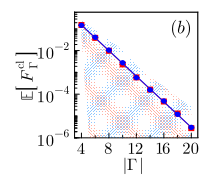

R2: m = -0.6739721735522238 ± 0.005119963731507439,  ξ = -1.483740782248354 ± 0.011271532104999296
R3: m = -0.6760051771261585 ± 0.005476467801413513,  ξ = -1.4792786118165726 ± 0.011983963971064767


In [39]:
# === Plot Monomer Loop Correlator for Regions R2 and R3 ===
pb = plot(
    xlim = (3, 21),               # X-axis range for loop sizes
    ylim = (1e-6, 0.6),           # Y-axis limits (log scale)
    yaxis = :log                 # Logarithmic scale for correlation magnitude
)

trimlim = [0, 21]                # Fitting range for exponential fit
plt_corr(data2, data3, trimlim; mkrsz=mkrsz)  # Overlay data from R2 and R3

# Axis ticks
plot!(yticks = [1e-6, 1e-4, 1e-2], xminorticks = 2, xticks = [4, 8, 12, 16, 20])

# Axis labels
plot!(xlabel = L"$ |\Gamma\;|$", ylabel = L"\mathbb{E} \left[ F_{\Gamma}^{\textrm{cl}} \right]")

# Annotate with subplot label
annotate!(18.7, 0.1, text(L"(b)", 12))

# Apply consistent formatting (grid, legend, size, etc.)
plot_fm_setting(pb)

# Save and display the plot
savefig("./images/paper/monomer-loops.pdf")
display(pb)

## Path averaged product of Vison Wilson lines (Fig. 4c)

In [40]:
# === Load Vison Line Numerator Data for Region R2 ===
fl = load("./data/plot_data/paper-R2-vison-lines.jld")
mean_dist_num_prod = fl["mean_dist_num_prod"]    # Average loop lengths
mean_num_prod      = fl["mean_num_prod"]         # Mean correlator values
env_up             = fl["env_up"]                # Upper envelope
env_dn             = fl["env_dn"]                # Lower envelope
mean_dev_num_prod1 = fl["mean_dev_num_prod"]     # List of standard errors (with a 0 prepended)
log_dev            = fl["log_dev"]               # Logarithmic deviations
bins               = fl["bins"]                  # Binned raw data

# Remove the first element (typically a dummy 0 for compatibility)
mean_dev_num_prod = mean_dev_num_prod1[2:end]

# Package Region R2 data as a tuple
data2 = mean_dist_num_prod, mean_num_prod, std.(bins), mean_dev_num_prod


# === Load Vison Line Numerator Data for Region R3 ===
fl = load("./data/plot_data/paper-R3-vison-lines.jld")
mean_dist_num_prod = fl["mean_dist_num_prod"]
mean_num_prod      = fl["mean_num_prod"]
env_up             = fl["env_up"]
env_dn             = fl["env_dn"]
mean_dev_num_prod1 = fl["mean_dev_num_prod"]
log_dev            = fl["log_dev"]
bins               = fl["bins"]

mean_dev_num_prod = mean_dev_num_prod1[2:end]
data3 = mean_dist_num_prod, mean_num_prod, std.(bins), mean_dev_num_prod
;

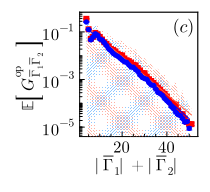

R2: m = -0.1819634488785594 ± 0.0035776651930108454,  ξ = -5.495609179552264 ± 0.10805164332314278
R3: m = -0.19118814441339535 ± 0.0031967458689603928,  ξ = -5.23044984336349 ± 0.08745531257117675


In [41]:
# === Plot Vison Loop Numerator Product Correlators (Region R2 and R3) ===

# Initialize plot with appropriate axis limits and log scale on y-axis
pc = plot(xlim = (1, 54), ylim=(4e-6, 0.7), yaxis=:log)

# Define fitting/trimming limits (used to fit exponentials only in this range)
trimlim = [0, 40]

# Plot correlators and extract correlation lengths ξ2 (R2) and ξ3 (R3)
ξ2, ξ3 = plt_corr(data2, data3, trimlim; mkrsz=mkrsz)

# Set tick marks and axis labels
plot!(yticks = [1e-5, 1e-3, 1e-1], xticks=[0, 20, 40], xminorticks=4)
plot!(xlabel = L"$ |\overline{\Gamma}_1| + |\overline{\Gamma}_2| $")
plot!(ylabel = L"\mathbb{E} \left[ G_{\overline{\Gamma}_1 \overline{\Gamma}_2 }^{\textrm{op}} \right]")

# Apply consistent formatting for figure margin, grid, frame, size, etc.
plot_fm_setting(pc)

# Annotate the panel label
annotate!(48, 0.15, text(L"(c)", 12))

# Display the figure (uncomment to save)
savefig("./images/paper/vison-lines.pdf")
display(pc)

In [42]:
# === Estimate Correlation Lengths from Exponential Fits ===

# Define the starting point for fit window
start_pt = 15

# Define fitting end points and fitting start points to sweep over
end_pts = [25, 30, 35, 40, 45]
start_pts = [0, 5, 10]

# Compute correlation lengths for region R2 across different fitting windows
corr_lens2 = [plt_corr(data2, data3, [s, e]; verbose=false)[1] for e in end_pts, s in start_pts]

# Compute correlation lengths for region R3 across different fitting windows
corr_lens3 = [plt_corr(data2, data3, [s, e]; verbose=false)[2] for e in end_pts, s in start_pts]

# Flatten the 2D arrays to 1D vectors for statistical analysis
corr_lens2 = vec(corr_lens2)
corr_lens3 = vec(corr_lens3)

# Print mean and standard deviation of correlation lengths
println("Region R2: ", mean(corr_lens2), " ± ", std(corr_lens2))
println("Region R3: ", mean(corr_lens3), " ± ", std(corr_lens3))

Region R2: -5.65604113325555 ± 0.25974635059285045
Region R3: -5.29197225528438 ± 0.14837441415658104


## Path averaged Vison Wilson loops (Fig. 4d)

In [43]:
# === Load and Preprocess Denominator Vison Loop Data for R2 and R3 ===

# --- Region R2 ---
fl = load("./data/plot_data/paper-R2-vison-loops.jld")

# Extract relevant data arrays
mean_dist_den = fl["mean_dist_den"]
mean_den = fl["mean_den"]
env_up = fl["env_up"]
env_dn = fl["env_dn"]
mean_dev_den1 = fl["mean_dev_den"]
log_dev = fl["log_dev"]
bins = fl["bins"]

# Drop the first element (typically a dummy or unreliable point)
mean_dev_den = mean_dev_den1[2:end]

# Filter to exclude any unusually large error bars (e.g. outliers or instabilities)
inds = findall(x -> x < 1, mean_dev_den)

# Pack cleaned data into a tuple for plotting
data2 = mean_dist_den[inds], mean_den[inds], std.(bins)[inds], mean_dev_den[inds]


# --- Region R3 ---
fl = load("./data/plot_data/paper-R3-vison-loops.jld")

# Repeat the same processing steps
mean_dist_den = fl["mean_dist_den"]
mean_den = fl["mean_den"]
env_up = fl["env_up"]
env_dn = fl["env_dn"]
mean_dev_den1 = fl["mean_dev_den"]
log_dev = fl["log_dev"]
bins = fl["bins"]

mean_dev_den = mean_dev_den1[2:end]
inds = findall(x -> x < 1, mean_dev_den)

data3 = mean_dist_den[inds], mean_den[inds], std.(bins)[inds], mean_dev_den[inds]
;

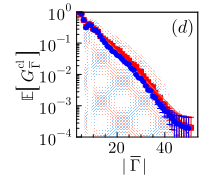

R2: m = -0.17867995949622695 ± 0.0030673165121957017,  ξ = -5.596598537515989 ± 0.0960742276562672
R3: m = -0.19362275906599263 ± 0.0024767021747312355,  ξ = -5.164682110841985 ± 0.0660634084413504


In [44]:
# === Plot: Denominator Vison Loop Correlator (Panel d) ===

# Set axis limits and log scale for y-axis
pd = plot(xlim = (3, 54), ylim = (1e-4, 1), yaxis = :log)

# Range of distances to use for fitting an exponential decay
trimlim = [0, 40]

# Plot the two datasets (R2 and R3) with error bars and spread ribbon
plt_corr(data2, data3, trimlim; mkrsz=mkrsz)

# Customize tick marks
plot!(yticks = [1e-4, 1e-3, 1e-2, 1e-1, 1e0], xticks = [0, 20, 40], xminorticks = 4)

# Axis labels (in LaTeX format)
plot!(xlabel = L"$ |\overline{\Gamma}\;|$", 
      ylabel = L"\mathbb{E} \left[ G_{\overline{\Gamma}}^{\textrm{cl}} \right]")

# Apply standard formatting for this figure style
plot_fm_setting(pd)

# Annotate subplot label (d)
annotate!(48, 0.3, text(L"(d)", 12))

# Save or display the figure
savefig("./images/paper/vison-loops.pdf")
display(pd)

In [45]:
# === Estimate correlation lengths over various fitting windows ===

start_pts = [0, 5, 10]                     # Starting points of fit windows
end_pts = [25, 30, 35, 40, 45]             # End points of fit windows

# Compute correlation lengths ξ for dataset R2 (index 1 from plt_corr return)
corr_lens2 = [plt_corr(data2, data3, [start_pt, end_pt]; verbose=false)[1] 
              for end_pt in end_pts, start_pt in start_pts]

# Compute correlation lengths ξ for dataset R3 (index 2 from plt_corr return)
corr_lens3 = [plt_corr(data2, data3, [start_pt, end_pt]; verbose=false)[2] 
              for end_pt in end_pts, start_pt in start_pts]

# Output mean and standard deviation for each
println("R2  ξ = ", mean(corr_lens2), " ± ", std(corr_lens2))
println("R3  ξ = ", mean(corr_lens3), " ± ", std(corr_lens3))

R2  ξ = -5.859680637111647 ± 0.4224385944150766
R3  ξ = -5.305832995479514 ± 0.18964855736774133


### Combine the 4 plots to get Fig. 4 of the paper

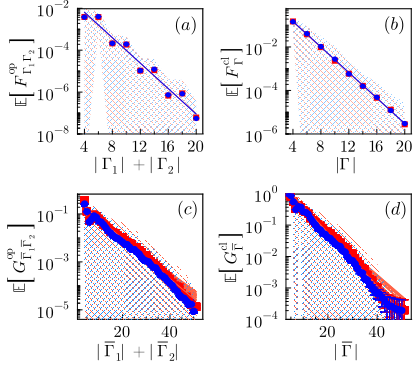

"/Users/jeet/umd/acad/projects/quasicrystals/penrose-dimer-monte-carlo/images/paper/monomer-vison-loops-lines.pdf"

In [46]:
# === Combine all four FM correlator plots into a single figure ===
# pa, pb, pc, pd are assumed to be predefined plots representing panels (a)–(d)

pcombined = plot(
    pa, pb, pc, pd, 
    layout = (2, 2),                          # 2 rows × 2 columns
    size = 1.2 .* (350, 310),                # Overall figure size
    margins = 0.1Plots.mm                   # Compact inter-panel spacing
)

# Display the final composed figure
display(pcombined)

# Optional: Save to file
savefig("./images/paper/monomer-vison-loops-lines.pdf")